## IMDB 데이터를 활용한 토큰화 및 정수 인코딩 실습
- 실습 목적

In [1]:
import nltk
from tqdm import tqdm
from nltk.tokenize import word_tokenize, TreebankWordTokenizer
import numpy as np
import pandas as pd
from string import punctuation
from itertools import chain
from collections import Counter
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt

nltk 라이브러리를 활용한 데이터 불러오기

In [2]:
nltk.download('punkt')
nltk.download('movie_reviews')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\원종복\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\원종복\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!


True

In [3]:
from nltk.corpus import movie_reviews

review_category = movie_reviews.categories()
review_category

['neg', 'pos']

In [4]:
negative_file = movie_reviews.fileids(review_category[0])
positive_file = movie_reviews.fileids(review_category[1])

print(f"negative_file : {len(negative_file)}, {negative_file}")
print(f"positive_file : {len(positive_file)}, {positive_file}")

negative_file : 1000, ['neg/cv000_29416.txt', 'neg/cv001_19502.txt', 'neg/cv002_17424.txt', 'neg/cv003_12683.txt', 'neg/cv004_12641.txt', 'neg/cv005_29357.txt', 'neg/cv006_17022.txt', 'neg/cv007_4992.txt', 'neg/cv008_29326.txt', 'neg/cv009_29417.txt', 'neg/cv010_29063.txt', 'neg/cv011_13044.txt', 'neg/cv012_29411.txt', 'neg/cv013_10494.txt', 'neg/cv014_15600.txt', 'neg/cv015_29356.txt', 'neg/cv016_4348.txt', 'neg/cv017_23487.txt', 'neg/cv018_21672.txt', 'neg/cv019_16117.txt', 'neg/cv020_9234.txt', 'neg/cv021_17313.txt', 'neg/cv022_14227.txt', 'neg/cv023_13847.txt', 'neg/cv024_7033.txt', 'neg/cv025_29825.txt', 'neg/cv026_29229.txt', 'neg/cv027_26270.txt', 'neg/cv028_26964.txt', 'neg/cv029_19943.txt', 'neg/cv030_22893.txt', 'neg/cv031_19540.txt', 'neg/cv032_23718.txt', 'neg/cv033_25680.txt', 'neg/cv034_29446.txt', 'neg/cv035_3343.txt', 'neg/cv036_18385.txt', 'neg/cv037_19798.txt', 'neg/cv038_9781.txt', 'neg/cv039_5963.txt', 'neg/cv040_8829.txt', 'neg/cv041_22364.txt', 'neg/cv042_11927.tx

불용어 처리를 위한 불용어 리스트 정의
- vocabulary 확인 이후 추가로 처리하고 싶은 불용어 정의 가능하다!

In [5]:
nltk.download('stopwords')
nltk_stop_words = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\원종복\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
nltk_stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

토큰화 작업 수행하기

In [7]:
# 불용와 각종 첨자를 제거한 토큰화
# 불가피하게 제거되지 못한 불용어나 의미없는 단위는 vocab에서 걸러도 됨
def tokenize(files):
    tokenized_sentence = []
    tmps = [TreebankWordTokenizer().tokenize(movie_reviews.raw(file).lower()) for file in tqdm(files)]
    for tmp in tmps:
        tokenized_sentence.append([word for word in tmp if word not in (nltk_stop_words and punctuation)])
    return tokenized_sentence

In [8]:
negative_token = tokenize(negative_file)    # 1000개
positive_token = tokenize(positive_file)    # 1000개
total_token = negative_token + positive_token   # 2000개

100%|██████████| 1000/1000 [00:02<00:00, 424.34it/s]


In [9]:
total_token

[['plot',
  'two',
  'teen',
  'couples',
  'go',
  'to',
  'a',
  'church',
  'party',
  'drink',
  'and',
  'then',
  'drive',
  'they',
  'get',
  'into',
  'an',
  'accident',
  'one',
  'of',
  'the',
  'guys',
  'dies',
  'but',
  'his',
  'girlfriend',
  'continues',
  'to',
  'see',
  'him',
  'in',
  'her',
  'life',
  'and',
  'has',
  'nightmares',
  'what',
  "'s",
  'the',
  'deal',
  'watch',
  'the',
  'movie',
  'and',
  '``',
  'sorta',
  '``',
  'find',
  'out',
  'critique',
  'a',
  'mind-fuck',
  'movie',
  'for',
  'the',
  'teen',
  'generation',
  'that',
  'touches',
  'on',
  'a',
  'very',
  'cool',
  'idea',
  'but',
  'presents',
  'it',
  'in',
  'a',
  'very',
  'bad',
  'package',
  'which',
  'is',
  'what',
  'makes',
  'this',
  'review',
  'an',
  'even',
  'harder',
  'one',
  'to',
  'write',
  'since',
  'i',
  'generally',
  'applaud',
  'films',
  'which',
  'attempt',
  'to',
  'break',
  'the',
  'mold',
  'mess',
  'with',
  'your',
  'head',

In [10]:
# from itertools import chain : 여러 iterable 객체를 하나의 iterable로 결합할 때 사용
negative_word = list(chain(*negative_token))    # 634350
positive_word = list(chain(*positive_token))    # 707176
total_word = list(chain(*total_token))  # 1341526

vocabulary 만들기

In [11]:
# vocabulary 만들기 - 전체 데이터셋을 대상으로 만들어야

def make_vocab(tokens):
    vocab = []
    
    for token in tokens:
        for word in token:
            vocab.append(word)
    return list(set(vocab))
    
negative_vocab = make_vocab(negative_token) # 32177
positive_vocab = make_vocab(positive_token) # 34204
total_vocab = make_vocab(total_token) # 46686

실제 단어의 등장 빈도 파악하기

In [12]:
negative_freq = sorted(Counter(negative_word).items(), key=lambda x:x[1], reverse=True)
positive_freq = sorted(Counter(positive_word).items(), key=lambda x:x[1], reverse=True)
total_freq = sorted(Counter(total_word).items(), key=lambda x:x[1], reverse=True)

In [13]:
total_freq

[('the', 76217),
 ('a', 37980),
 ('and', 35404),
 ('of', 33972),
 ('to', 31772),
 ('is', 26054),
 ('in', 21611),
 ("'s", 18128),
 ('``', 17626),
 ('it', 16056),
 ('that', 15910),
 ('as', 11348),
 ('with', 10782),
 ('for', 9917),
 ('this', 9571),
 ('his', 9568),
 ('film', 9443),
 ('he', 8840),
 ('i', 8836),
 ('but', 8601),
 ('on', 7249),
 ('are', 7204),
 ('by', 6218),
 ("n't", 6217),
 ('be', 6083),
 ('an', 5742),
 ('who', 5678),
 ('movie', 5671),
 ('not', 5671),
 ('one', 5580),
 ('you', 5282),
 ('was', 5225),
 ('have', 5045),
 ('from', 4987),
 ('at', 4971),
 ('they', 4814),
 ('has', 4811),
 ('her', 4508),
 ('all', 4259),
 ('there', 3754),
 ('so', 3585),
 ('like', 3545),
 ('about', 3518),
 ('out', 3441),
 ('more', 3342),
 ('what', 3308),
 ('when', 3253),
 ('which', 3160),
 ('she', 3126),
 ('their', 3117),
 ('up', 3108),
 ('or', 3106),
 ('do', 3090),
 ('some', 2981),
 ('just', 2901),
 ('does', 2834),
 ('if', 2790),
 ('we', 2756),
 ('him', 2631),
 ('into', 2618),
 ('even', 2556),
 ('only',

모델 분석에 있어 통제 조건을 활용하여 단어 집합의 크기 축소
- 전체 단어 집합의 크기가 약 47000여개에 해당
- 단어 집합에서 희귀 단어가 차지하는 비율과, 전체 등장 빈도에서 희귀 단어가 등장하는 빈도를 비교

In [14]:
# 등장 빈도가 높은 요소들이 많으므로 threshold와 같은 조건을 통해 통제
# 통제를 위해 데이터셋 확인
# 단어 집합 크기 : 46686 (len(total_vocab))
threshold = 15

def check_cnt(threshold, total_freq):
    sparse_vocab_cnt = 0    # 희귀 단어의 갯수 count
    sparse_vocab_freq = 0   # 희귀 단어의 등장 빈도 count
    total_freq_cnt = 0  # 전체 단어의 등장 빈도 count

    for key, value in total_freq:
        total_freq_cnt += value
        if (value <= threshold):    # 등장 빈도가 threshold 이하일 경우
            sparse_vocab_cnt += 1   # 등장빈도가 threshold 이하인 희귀 단어의 갯수
            sparse_vocab_freq += value      # 등장 빈도가 threshold 이하인 희귀 단어의 등장 빈도
        
    print(f"등장 빈도가 {threshold}번 이하인 희귀 단어의 수 : {sparse_vocab_cnt}")
    print("단어 집합에서 희귀 단어의 비율 : %.2f%%" % ((sparse_vocab_cnt / len(total_vocab)) * 100))
    print("전체 등장 빈도에서 희귀 단어의 등장 빈도 비율 : %.2f%%" % ((sparse_vocab_cnt / total_freq_cnt) * 100))
    
    return sparse_vocab_cnt, sparse_vocab_freq, total_freq_cnt
    
sparse_vocab_cnt, sparse_vocab_freq, total_freq_cnt = check_cnt(threshold=threshold, total_freq=total_freq)

등장 빈도가 15번 이하인 희귀 단어의 수 : 40050
단어 집합에서 희귀 단어의 비율 : 85.79%
전체 등장 빈도에서 희귀 단어의 등장 빈도 비율 : 2.99%


threshold = 15일 때, 희귀 단어의 비율은 약 86%이나 실제 사용율은 약 3.0%
- 우선적으로 threshold가 15 이하인 단어는 인코딩 과정에서 제외
- 단어 집합 축소를 통한 계산 효율성 증대를 위함

In [15]:
# 전체 단어 집합 중 빈도수 15 이하인 단어 제거
total_vocab_size = len(total_vocab) - sparse_vocab_cnt
total_vocab_scaled = total_vocab[:total_vocab_size]    # 6636개
print(f"원래의 단어 집합의 크기 : {len(total_vocab)}")
print(f"수정된 단어 집합의 크기 : {len(total_vocab_scaled)}")

원래의 단어 집합의 크기 : 46686
수정된 단어 집합의 크기 : 6636


In [16]:
tokenizer = Tokenizer(num_words=None)
tokenizer.fit_on_texts(total_vocab_scaled)

print(len(tokenizer.index_word))

6827


단어 집합에 대한 정수 인코딩 진행
- keras.preprocessing.text.Tokenizer를 사용하면 vocabulary를 만들고 encoding과 decoding까지 가능 (추후 이 방법으로 해볼 것)

In [17]:
# 전체 단어 집합에서 빈도수 15 이하인 단어는 제거
# 제거된 단어 집합이 등장하게 되면 키 에러가 발생할 수 있음
# 키 에러가 발생하지 않고, 제거된 단어 집합 혹은 기록되지 않은 단어 집합이 투입되었을 경우,
# 결과는 정상 출력하면서 위 사항을 확인하기 위해 스페셜 토큰 추가
# 인코딩과 디코딩을 위한 vocab 기반 리스트

word_to_index = {'<PAD>' : 0, '<UNK>' : 1}
word_to_index.update({word : idx+2 for idx, word in enumerate(total_vocab_scaled)})

index_to_word = {0 : '<PAD>', 1 : '<UNK>'}
index_to_word.update({idx+2 : word for idx, word in enumerate(total_vocab_scaled)})

In [18]:
print(f"원래의 단어 집합의 크기 : {len(total_vocab)}")
print(f"수정된 단어 집합의 크기 : {len(total_vocab_scaled)}")
print(f"스페셜 토큰 추가된 단어 집합의 크기 : {len(word_to_index)}")

원래의 단어 집합의 크기 : 46686
수정된 단어 집합의 크기 : 6636
스페셜 토큰 추가된 단어 집합의 크기 : 6638


In [19]:
# 텍스트를 시퀀스 데이터 (인코딩 데이터)로 변환해주는 함수
def texts_to_sequences(token_data, word_to_index):
    encoded_token_data = []
    for token in token_data:    # 각 데이터 포인트 별로 리스트로 묶여 있으므로,
        tmp = []
        for word in token:      # 리스트를 두 번 풀어야 함
            try:
                tmp.append(word_to_index[word])
            except KeyError:
                tmp.append(word_to_index['<UNK>'])
        encoded_token_data.append(tmp)
    return encoded_token_data

In [20]:
def sequences_to_text(encoded_token_data, index_to_word):
    decoded_token_data = [[index_to_word[num] for num in token] for token in encoded_token_data]
    return decoded_token_data

In [21]:
encoded_token_data = texts_to_sequences(token_data=negative_token, word_to_index=word_to_index)
decoded_token_data = sequences_to_text(encoded_token_data=encoded_token_data, index_to_word=index_to_word)

In [ ]:
decoded_token_data

In [ ]:
encoded_token_data

리뷰의 최대길이와 평균길이 측정 - 패딩을 위함!

In [24]:
print(f"리뷰의 최대 길이 : {max(len(review) for review in total_token)}")
print(f"리뷰의 평균 길이 : {sum([len(review) for review in total_token]) / len(total_token)}")
print(f"리뷰의 최소 길이 : {min(len(review) for review in total_token)}")

리뷰의 최대 길이 : 2471
리뷰의 평균 길이 : 670.763
리뷰의 최소 길이 : 17


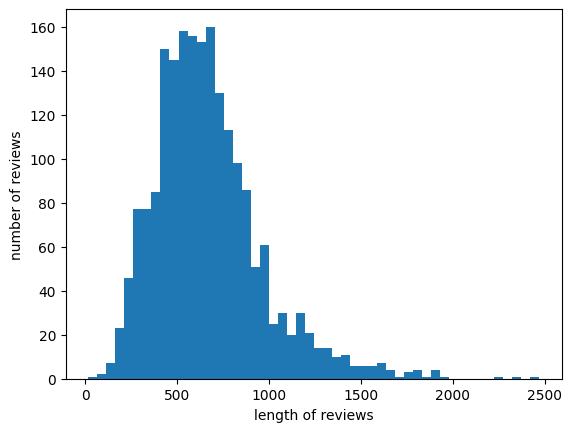

In [26]:
# 리뷰 길이의 시각화
plt.hist([len(review) for review in total_token], bins=50)
plt.xlabel('length of reviews')
plt.ylabel('number of reviews')
plt.show()

딥러닝 모델이 데이터를 처리하는 묶음 단위에서는 길이가 동일해야 딥러닝 모델이 행렬로 인식 가능
- 패딩을 통해 모델의 길이를 맞춰주는 것이 필요

- 그 전에 해결해야할 문제점 : tokenize할 때 stopwords가 적용되지 않음

모델 구축과 훈련을 위한 x, y data 만들기
- x_data : negative_token, positive_token
- y_data : negative_answer, positive_anwer

In [ ]:
negative_answer = [0 for _ in range(len(negative_token))]
positive_answer = [1 for _ in range(len(positive_token))]

In [ ]:
x_data = negative_token + positive_token
y_data = negative_answer + positive_answer

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(
    x_data, y_data, test_size=0.2, random_state=42, stratify=y_data
)

In [ ]:
print(f"len(x_train) : {len(x_train)}")
print(f"len(x_test) : {len(x_test)}")
print(f"len(y_train) : {len(y_train)}")
print(f"len(x_test) : {len(y_test)}")

len(x_train) : 1600
len(x_test) : 400
len(y_train) : 1600
len(x_test) : 400


In [ ]:
# Optional / DataFrame 만들기
import pandas as pd
negative_answer = [0 for _ in range(len(negative_token))]
positive_answer = [1 for _ in range(len(positive_token))]
df = pd.DataFrame({'review' : negative_token, 'sentiment' : [0 for _ in range(len(negative_token))]})
df['review'] = df['review'].append(pd.Series(positive_token), ignore_index=True)
df['sentiment'] = df['sentiment'].append(pd.Series(positive_answer), ignore_index=True)
df

AttributeError: 'Series' object has no attribute 'append'

AttributeError: 'NoneType' object has no attribute 'info'